<a href="https://colab.research.google.com/github/m-garciar/machine-learning/blob/main/Taller_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#AUTORES: Maria Fernanda Garcia  y Juan Manuel Rivera

# 0. Importar librerías

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip --quiet

     - 25.9 MB 660 kB/s
     |████████████████████████████████| 10.9 MB 5.3 MB/s 
     |████████████████████████████████| 596 kB 59.0 MB/s 
     |████████████████████████████████| 102 kB 9.6 MB/s 
     |████████████████████████████████| 675 kB 57.0 MB/s 
     |████████████████████████████████| 4.7 MB 41.0 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
     |████████████████████████████████| 812 kB 65.1 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
#Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Analisis profundo de datos
from pandas_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, LabelEncoder
from sklearn.linear_model import Lasso, Ridge, LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.model_selection import GridSearchCV

#Librerías extras
import itertools

# 1. ENTENDIMIENTO DEL NEGOCIO

Para poder predecir los precios de venta de los inmuebles en el mercado ruso se realizará aprendizaje supervisado tipo regresión con base en las variables proporcionadas por el cliente.

**DICCIONARIO**

- date - Fecha de publicación del anuncio.

- time - Tiempo que la publicación estuvo activo.

- geo_lat - Latitud.

- geo_lon - Longitud.

- region - Region de Rusia. Hay 85 regiones en total.

- building_type - Tipo de Fachada. 0 - Other. 1 - Panel. 2 - Monolithic. 3 - Brick. 4 - Blocky. 5 - Wooden.

- object_type - Tipo de Apartmento. 1 - Secondary real estate market; 2 - New building.

- level - Piso del Apartamento.

- levels - Número de pisos.

- rooms - Número de Habitaciones. Si el valor es "-1", Significa que es un "studio apartment".

- area - Área total del apartamento.

- kitchen_area - Área de la Cocina

- price - Precio. En rublos

#2. ENTENDIMIENTO DE LOS DATOS

Se eliminaron las filas con datos faltantes.

También se eliminó el inmueble con - 2 habitaciones dado que no se encuentra en el rango admisible.

Se restructuró la variable Type_building y se convirtió a una variable binaria llamada "used" (1 = si, 0 = no).

Se excluyó la  variable fecha por datos faltantes en el día y por baja variabilidad en año y mes.

Debido a que el interés del negocio es conocer el precio antes de poner en inmueble a la venta, el tiempo que pasará hasta que la compren no se tiene como una variable de entrada; por esto, no puede emplearse para predecir el precio del inmueble, así que se retiró.

Asimismo los datos que no se consideran coherentes como areas de cocina mayores al área total del inmueble o áreas del inmueble menores a 10m2 fueron excluidos.

Inmuebles con precios iguales a 0 y 1 también fueron retirados.

An final del proceso de limpieza, la base de datos cuenta con 66696 inmuebles. Teniendo en cuenta que la base de datos inicial contaba con 67762 inmuebles,se eliminó el 1.5% de los datos, lo cual se considera tolerable.

In [ ]:
data = pd.read_csv("rus.area.csv")
data.head()

,price,geo_lat,geo_lon,region,building_type,level,levels,rooms,area,kitchen_area,Used
0,3900000,55.786480,49.223459,2922,1,10,0,3,67.0,8.80,1
1,4250000,55.905045,37.393578,81,1,25,25,1,39.0,10.50,1
2,4340360,59.882717,30.451298,2661,0,4,27,1,57.0,0.38,1
3,8000000,55.640462,37.359415,3,1,1,17,3,74.5,10.00,1
4,2750000,55.042053,82.940926,9654,1,1,5,2,44.6,6.00,1


Se realiza división de la muestra de entrenamiento y la de evaluación de forma aleatoria y con semilla para garantizar la reproducibilidad

In [ ]:
train, test = train_test_split(data, test_size=0.2, random_state=26)
train.head()

,price,geo_lat,geo_lon,region,building_type,level,levels,rooms,area,kitchen_area,Used
13156,3407520,59.913830,30.309930,2661,0,16,21,3,36.64,10.7,1
24837,3250000,55.419263,37.502089,81,1,0,24,1,39.00,10.0,0
63853,1970000,55.994909,37.863374,81,3,8,9,1,21.70,5.0,1
57767,975000,55.277570,36.332292,81,3,1,2,1,28.90,6.0,1
57508,8199000,59.907171,30.318967,2661,3,4,5,4,94.00,10.0,1


Visualización de los datos de la muestra de entrenamiento

In [ ]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
corr = train.corr()
corr.style.background_gradient(cmap='coolwarm')

,price,geo_lat,geo_lon,region,building_type,level,levels,rooms,area,kitchen_area,Used
price,1.000000,0.051132,-0.061448,-0.053936,-0.030027,0.039793,0.034591,0.086971,0.199836,0.147013,0.012617
geo_lat,0.051132,1.000000,0.004835,-0.015780,-0.273603,0.076515,0.138168,0.011121,0.026462,0.050700,-0.034043
geo_lon,-0.061448,0.004835,1.000000,0.759922,-0.019929,-0.111837,-0.177864,0.003922,-0.074553,-0.175012,-0.267975
region,-0.053936,-0.015780,0.759922,1.000000,-0.108432,-0.088259,-0.145247,-0.024816,-0.042058,-0.109448,-0.238921
building_type,-0.030027,-0.273603,-0.019929,-0.108432,1.000000,-0.159051,-0.263330,0.027384,-0.034917,-0.086746,0.072986
level,0.039793,0.076515,-0.111837,-0.088259,-0.159051,1.000000,0.592145,-0.021678,0.070068,0.121889,-0.139320
levels,0.034591,0.138168,-0.177864,-0.145247,-0.263330,0.592145,1.000000,-0.078318,0.069814,0.171349,-0.242393
rooms,0.086971,0.011121,0.003922,-0.024816,0.027384,-0.021678,-0.078318,1.000000,0.584819,0.179163,0.086936
area,0.199836,0.026462,-0.074553,-0.042058,-0.034917,0.070068,0.069814,0.584819,1.000000,0.477856,0.021954
kitchen_area,0.147013,0.050700,-0.175012,-0.109448,-0.086746,0.121889,0.171349,0.179163,0.477856,1.000000,-0.018488


Después de realizar la limpieza de la base ya no hay datos faltantes. La mayoría de los apartamentos estan ubicados en latitudes intermedias y en una longitud entre 50° y 60°.

Las fachadas de los edificios suelen ser en panel o ladrillo, y se ubican en pisos menores al 10.

Cada apartamento suele tener entre 2 y 4 habitaciones.

Menos del 5% tienen un área total de más de 94 m2 o una cocina de más de 20m2.

Sólo el 24% de las viviendas son nuevas.

Se observa correlación moderada entre el área del inmueble y el área de la cocina.

Hay una correlación un poco más alta entre el número de pisos del apartamentos y el número de pisos del edificio, y entre el área del inmueble y el número de habitaciones. La correlación más elevada se observa entre la región y la longitud geográfica.

# 3. PREPARACIÓN DE LOS DATOS

En el conjunto de datos se tienen 2 variables categóricas: la región (region) y el tipo de fachada (building_type).

Para poder realizar la regresión usando estos datos se usará un codificador One-Hot para el tipo de fachada y LabelEncoder para la región.

In [ ]:
data['building_type'] = data['building_type'].astype('category')
data['region'] = data['region'].astype('category')

In [ ]:
# Se crea una instancia del codificador One-Hot 
oneHot = OneHotEncoder(handle_unknown='ignore')

# Se recodifica la columna building_type y se añade a los datos
fachada = pd.DataFrame(oneHot.fit_transform(data[['building_type']]).toarray())
data = data.join(fachada)

# Se ajustan los nombres de las nuevas columnas y se elimina la columna original
data.rename(columns={0:'Fachada_otros',1:'Fachada_panel',2:'Fachada_Monolitica',3:'Fachada_ladrillo',4:'Fachada_bloque',5:'Fachada_madera'},inplace=True)
data.drop(labels='building_type',axis=1, inplace=True)

In [ ]:
# Se crea una instancia del codificador Label Encoder
le_region = LabelEncoder()

#Se ajustan los datos y se guardan en una nueva columna
data['region_label_encoder']=le_region.fit_transform(data['region'])

#Se elimina la columna original
data.drop(labels='region',axis=1, inplace=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f98ae7fc090>]],
      dtype=object)

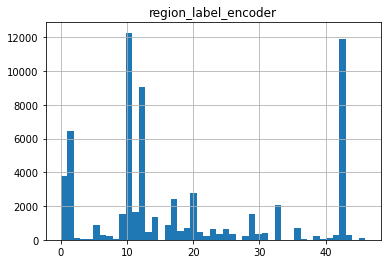

In [ ]:
#Es importante notar que la distribución de datos entre regiones puede sesgar el rendimiento del modelo
data.hist(column='region_label_encoder', bins=47)

In [ ]:
# Se recodifica la columna region_label_encoder y se añade a los datos
region = pd.DataFrame(oneHot.fit_transform(data[['region_label_encoder']]).toarray())
data = data.join(region)

#Se elimina la columna original
data.drop(labels='region_label_encoder',axis=1, inplace=True)

for i in range (0,47):
  data.rename(columns={i:'Region_'+str(i)},inplace=True)

data

,price,geo_lat,geo_lon,level,levels,rooms,area,kitchen_area,Used,Fachada_otros,Fachada_panel,Fachada_Monolitica,Fachada_ladrillo,Fachada_bloque,Fachada_madera,Region_0,Region_1,Region_2,Region_3,Region_4,Region_5,Region_6,Region_7,Region_8,Region_9,Region_10,Region_11,Region_12,Region_13,Region_14,Region_15,Region_16,Region_17,Region_18,Region_19,Region_20,Region_21,Region_22,Region_23,Region_24,Region_25,Region_26,Region_27,Region_28,Region_29,Region_30,Region_31,Region_32,Region_33,Region_34,Region_35,Region_36,Region_37,Region_38,Region_39,Region_40,Region_41,Region_42,Region_43,Region_44,Region_45,Region_46
0,3900000,55.786480,49.223459,10,0,3,67.00,8.80,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4250000,55.905045,37.393578,25,25,1,39.00,10.50,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4340360,59.882717,30.451298,4,27,1,57.00,0.38,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,8000000,55.640462,37.359415,1,17,3,74.50,10.00,1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2750000,55.042053,82.940926,1,5,2,44.60,6.00,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66691,7900000,59.980207,30.391762,12,13,2,61.00,15.00,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
66692,2950000,55.500098,36.030344,4,5,2,44.00,6.00,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
66693,1241000,54.946046,82.961274,15,18,1,41.39,0.00,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
66694,1250000,61.705465,30.700702,1,5,1,33.00,7.60,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# La división de datos se realiza luego de codificar las columnas categóricas
train, test = train_test_split(data, test_size=0.2, random_state=26)

Se separan los datos de entrenamiento en dos:
- Las variables independientes que se usarán para predecir el precio (X_train)
- El precio de las casa que se han vendido (Y_train)

In [ ]:
X_train, y_train = train.drop(['price'],axis=1), train['price']
X_test, y_test = test.drop(['price'],axis=1), test['price'] 

Además, se preparará un set de datos normalizados para poder comparar el desempeño de los modelos con datos normalizados vs sin normalizar

In [ ]:
scaler = StandardScaler()

columns = X_train.columns
X_train_norm = scaler.fit_transform(X_train)
X_train_norm = pd.DataFrame(X_train_norm,columns=columns)

X_test_norm = scaler.fit_transform(X_test)
X_test_norm = pd.DataFrame(X_test_norm,columns=columns)

# 4. MODELAMIENTO
Se evaluarán 4 modelos diferentes:
- Regresión lineal sin ningún ajuste
- Regresión lineal con ajuste L1 - Lasso
- Regresión lineal con ajuste L2 - Ridge
- Regresión polinomial

## 4.1 Regresión lineal

In [ ]:
LinearModel = LinearRegression()
LinearModel.fit(X_train, y_train)

LinearRegression()

In [ ]:
print('Coefficients: ', LinearModel.coef_)
print('Intercept: ',LinearModel.intercept_)

Coefficients:  [-3.51315102e+05 -6.16259165e+03  8.22300856e+04 -1.07034044e+05
 -6.38134017e+05  1.25457124e+05  1.37542491e+05  4.35719134e+05
  5.42478292e+05 -2.66884135e+05  5.26172872e+05  7.65832299e+04
 -3.36231859e+05 -5.42118399e+05  8.44040307e+06  2.45174953e+06
  2.73913360e+06 -4.27640833e+06 -4.89189392e+06  1.32816732e+06
 -7.95514870e+05 -1.11676806e+05  3.99398435e+06  1.17250447e+06
  5.29733527e+06  1.04866658e+06 -2.85124587e+06  4.68060917e+05
  1.23078800e+06 -1.67638063e-08 -3.84105418e+06  1.49745499e+06
  6.89636077e+05 -3.13720216e+05 -1.77950908e+06  3.20210531e+06
  9.94888140e+05  1.61379482e+06 -6.19580351e+06  3.76709358e+06
  3.04532378e+05  1.43074136e+05  1.22350214e+05  1.19177907e+05
  1.44688449e+05  1.53821344e+06  0.00000000e+00  1.85821951e+06
 -8.73951406e+05  4.78318537e+06  2.71215622e+04  4.68401248e+05
 -3.92560982e+06  2.87733962e+06 -4.24169227e+06 -1.53169491e+05
 -5.12914469e+06  2.03823064e+06 -1.29216890e+06 -7.78731785e+06
 -5.900419

In [ ]:
coef = dict(zip(X_train.columns, LinearModel.coef_))
coef

{'Fachada_Monolitica': 526172.8717019279,
 'Fachada_bloque': -336231.85925236996,
 'Fachada_ladrillo': 76583.22986806976,
 'Fachada_madera': -542118.3993619261,
 'Fachada_otros': 542478.2915791003,
 'Fachada_panel': -266884.1345355129,
 'Region_0': 8440403.066028167,
 'Region_1': 2451749.5301216645,
 'Region_10': 5297335.266121904,
 'Region_11': 1048666.5766993738,
 'Region_12': -2851245.8659854727,
 'Region_13': 468060.9166155362,
 'Region_14': 1230787.9983234494,
 'Region_15': -1.6763806343078613e-08,
 'Region_16': -3841054.1785325245,
 'Region_17': 1497454.989692168,
 'Region_18': 689636.076563952,
 'Region_19': -313720.21565744374,
 'Region_2': 2739133.5960712708,
 'Region_20': -1779509.0769902137,
 'Region_21': 3202105.312708286,
 'Region_22': 994888.1395170176,
 'Region_23': 1613794.817119485,
 'Region_24': -6195803.507482317,
 'Region_25': 3767093.5788627574,
 'Region_26': 304532.3779720223,
 'Region_27': 143074.1363601694,
 'Region_28': 122350.21424677249,
 'Region_29': 119177.

### Evaluación

Veremos que tal es el rendimiento del modelo para predecir los datos de entrenamiento y los del grupo test

In [ ]:
y_pred_train = LinearModel.predict(X_train)
y_pred_test = LinearModel.predict(X_test)

In [ ]:
n,p = X_train.shape
print('------------ Regresión Lineal (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

------------ Regresión Lineal (train) ------------
Residual sum of squares (MSE): 292930958199814.69
R2-score: 0.05641
Adj R2-score: 0.05533


In [ ]:
n,p = X_test.shape
print('------------ Regresión Lineal (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Lineal (test) ------------
Residual sum of squares (MSE): 248893634607663.75
R2-score: 0.05527
Adj R2-score: 0.05093


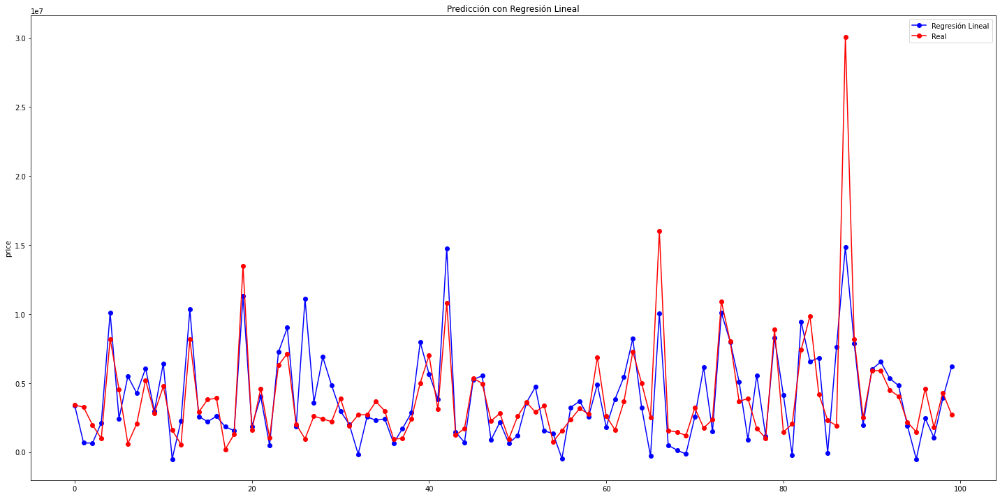

In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:100])))
axs.plot(xvals, y_pred_train[:100] ,'bo-', label='Regresión Lineal')
axs.plot(xvals, y_train[:100] ,'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

## 4.2 Regresión lineal con ajuste L1 - Lasso

Se evaluarán diferentes valores para los siguientes hiperparámetros:
- **Alpha:** Se evaluarán valores de alpha=(0.1, 10, 100 y 1000)

La búsqueda de hiperparámetros se realizará utilizando validación cruzada con 10 particiones

### Modelo con datos sin normalizar

In [ ]:
# Establecemos el espacio de búsqueda para los hiperparámetros que deseamos ajustar. 
param_grid = {'alpha':[0.1, 1,10,100,1000]}
#Creamos una regresión con ajuste de Lasso
LassoModel = Lasso()

In [ ]:
# Se usará el método GridSearch para evaluar los diferentes hiperparámetros con la partición cruzada con K=10
mejor_modelo = GridSearchCV(LassoModel, param_grid, cv=10)
# Ajuste del modelo
mejor_modelo.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.751e+18, tolerance: 1.440e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.166e+18, tolerance: 1.319e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [0.1, 1, 10, 100, 1000]})

In [ ]:
#Parámetros del mejor modelo
mejor_modelo.best_params_

{'alpha': 10}

In [ ]:
best_Lasso = mejor_modelo.best_estimator_
best_Lasso.fit(X_train, y_train)
print('Coefficients: ', best_Lasso.coef_)
print('Intercept: ',best_Lasso.intercept_)

Coefficients:  [-3.39360773e+05 -6.25169410e+03  8.22278032e+04 -1.07067177e+05
 -6.38097504e+05  1.25460286e+05  1.37539355e+05  4.35818010e+05
  4.67656157e+05 -3.41605987e+05  4.52297580e+05  1.09046184e+03
 -4.10749954e+05 -6.14496299e+05  7.74350426e+06  1.75516514e+06
  1.98514971e+06 -4.83452118e+06 -5.43875077e+06  6.18655981e+05
 -1.44046376e+06 -7.76750374e+05  3.23975569e+06  4.53361044e+05
  4.54980674e+06  3.67063022e+05 -3.41750221e+06 -2.15707604e+05
  5.28176235e+05  0.00000000e+00 -4.40287974e+06  8.01804376e+05
 -8.35546828e+03 -9.78432409e+05 -2.37452481e+06  2.45291941e+06
  2.90816055e+05  9.01759469e+05 -6.73625036e+06  2.98118073e+06
 -3.99196467e+05 -4.34424373e+05 -5.52029260e+05 -5.65753854e+05
 -5.21694768e+05  8.13429024e+05  0.00000000e+00  1.14838668e+06
 -1.46575629e+06  3.43902291e+06 -6.33194394e+05 -2.35054522e+05
 -3.95658946e+06  2.10284464e+06 -4.80324335e+06 -7.94125270e+05
 -5.67683082e+06  1.35456785e+06 -1.94352511e+06 -8.24439777e+06
 -6.439844

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.355e+18, tolerance: 1.656e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [ ]:
coef = dict(zip(X_train.columns, best_Lasso.coef_))
coef

{'Fachada_Monolitica': 452297.5798789537,
 'Fachada_bloque': -410749.9542770043,
 'Fachada_ladrillo': 1090.4618414113443,
 'Fachada_madera': -614496.29922345,
 'Fachada_otros': 467656.1572812556,
 'Fachada_panel': -341605.98700929206,
 'Region_0': 7743504.256960943,
 'Region_1': 1755165.1381951196,
 'Region_10': 4549806.7364181485,
 'Region_11': 367063.0217005639,
 'Region_12': -3417502.2112974743,
 'Region_13': -215707.60350574178,
 'Region_14': 528176.2348029473,
 'Region_15': 0.0,
 'Region_16': -4402879.736602286,
 'Region_17': 801804.3759476276,
 'Region_18': -8355.468280338471,
 'Region_19': -978432.4094854336,
 'Region_2': 1985149.7109033123,
 'Region_20': -2374524.813493068,
 'Region_21': 2452919.412086348,
 'Region_22': 290816.0549800219,
 'Region_23': 901759.4693069212,
 'Region_24': -6736250.364139753,
 'Region_25': 2981180.7343531563,
 'Region_26': -399196.4665141837,
 'Region_27': -434424.3732075105,
 'Region_28': -552029.2599721873,
 'Region_29': -565753.8542760795,
 'Regi

### Modelo con datos normalizados

In [ ]:
# Establecemos el espacio de búsqueda para los hiperparámetros que deseamos ajustar. 
param_grid = {'alpha':[1,10,100,500,1000]}
#Creamos una regresión con ajuste de Lasso
LassoModel = Lasso()
# Se usará el método GridSearch para evaluar los diferentes hiperparámetros con la partición cruzada con K=10
mejor_modelo_norm = GridSearchCV(LassoModel, param_grid, cv=10)
# Con datos normalizados
mejor_modelo_norm.fit(X_train_norm, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.119e+18, tolerance: 1.440e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.593e+18, tolerance: 1.319e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisa

GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [1, 10, 100, 500, 1000]})

In [ ]:
#Parámetros del mejor modelo
mejor_modelo_norm.best_params_

{'alpha': 500}

In [ ]:
best_Lasso_norm = mejor_modelo_norm.best_estimator_
best_Lasso_norm.fit(X_train_norm, y_train)
print('Coefficients: ', best_Lasso_norm.coef_)
print('Intercept: ',best_Lasso_norm.intercept_)

Coefficients:  [-1466312.92541728   -77052.66557247   404152.67111002  -699622.70385195
  -585793.83990918  3266499.52664313   867747.14365486   185600.86719595
   165079.8825144   -159541.74993535   175909.56416455       -0.
   -69243.37873752   -44365.57309351  1702332.89398213   395885.54512509
    52900.40088621  -152387.02416276  -163044.03514817    12082.7437699
  -113405.20646819   -73522.72030409    47933.13789021    -8608.00312038
  1525387.82469667    -4859.9064438  -1120388.82305478   -59116.27831567
     9796.49527819        0.          -477830.61973717    66979.03675258
   -40946.42317399  -130344.09343956  -472187.42963952   157979.65203075
   -16812.838034      33066.49875502  -461436.53506825   206847.08251016
   -64327.16147593    -9960.57709203   -54122.49037078  -150149.46626172
   -67591.97667017    18646.3184919         0.           106259.57196607
   -24833.50653514    12882.33744755  -104203.54345476   -20146.90216569
   -18290.79804699    86118.30280475  -103001

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.205e+15, tolerance: 1.656e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [ ]:
coef = dict(zip(X_train_norm.columns, best_Lasso_norm.coef_))
coef

{'Fachada_Monolitica': 175909.56416455333,
 'Fachada_bloque': -69243.37873751513,
 'Fachada_ladrillo': -0.0,
 'Fachada_madera': -44365.57309350559,
 'Fachada_otros': 165079.88251440154,
 'Fachada_panel': -159541.7499353474,
 'Region_0': 1702332.8939821345,
 'Region_1': 395885.54512508685,
 'Region_10': 1525387.8246966721,
 'Region_11': -4859.906443804823,
 'Region_12': -1120388.8230547814,
 'Region_13': -59116.27831567148,
 'Region_14': 9796.495278192164,
 'Region_15': 0.0,
 'Region_16': -477830.619737174,
 'Region_17': 66979.03675257787,
 'Region_18': -40946.4231739918,
 'Region_19': -130344.09343956006,
 'Region_2': 52900.40088620822,
 'Region_20': -472187.4296395177,
 'Region_21': 157979.65203075018,
 'Region_22': -16812.838033997403,
 'Region_23': 33066.498755023866,
 'Region_24': -461436.535068251,
 'Region_25': 206847.08251015533,
 'Region_26': -64327.16147593275,
 'Region_27': -9960.577092029404,
 'Region_28': -54122.49037077949,
 'Region_29': -150149.46626171982,
 'Region_3': -

In [ ]:
sort_orders = sorted(coef.items(), key=lambda x: x[1], reverse=True)

for i in sort_orders:
	print(i[0], i[1])

area 3266499.52664313
Region_0 1702332.8939821345
Region_10 1525387.8246966721
kitchen_area 867747.1436548607
level 404152.67111002485
Region_1 395885.54512508685
Region_43 331561.5219260758
Region_25 206847.08251015533
Used 185600.8671959483
Fachada_Monolitica 175909.56416455333
Fachada_otros 165079.88251440154
Region_21 157979.65203075018
Region_33 106259.57196606697
Region_39 86118.30280474873
Region_17 66979.03675257787
Region_2 52900.40088620822
Region_8 47933.13789021252
Region_23 33066.498755023866
Region_31 18646.31849189675
Region_35 12882.33744754625
Region_5 12082.74376989586
Region_14 9796.495278192164
Fachada_ladrillo -0.0
Region_15 0.0
Region_32 0.0
Region_11 -4859.906443804823
Region_9 -8608.003120381265
Region_27 -9960.577092029404
Region_22 -16812.838033997403
Region_38 -18290.798046988923
Region_37 -20146.902165693045
Region_34 -24833.5065351439
Region_18 -40946.4231739918
Fachada_madera -44365.57309350559
Region_41 -46166.867923616344
Region_28 -54122.49037077949
Reg

### Evaluación

Vamos a comparar el rendimiento de los modelos entrenados con datos normalizados y con datos sin normalizar

Sin normalizar

---

In [ ]:
y_pred_train = best_Lasso.predict(X_train)
y_pred_test = best_Lasso.predict(X_test)

In [ ]:
n,p = X_train.shape
print('------------ Regresión Lasso sin normalizar (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

------------ Regresión Lasso sin normalizar (train) ------------
Residual sum of squares (MSE): 292930996736978.00
R2-score: 0.05641
Adj R2-score: 0.05533


In [ ]:
n,p = X_test.shape
print('------------ Regresión Lasso sin normalizar (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Lasso sin normalizar (test) ------------
Residual sum of squares (MSE): 248894070684384.38
R2-score: 0.05527
Adj R2-score: 0.05093


Normalizados

---

In [ ]:
y_pred_train_n = best_Lasso_norm.predict(X_train_norm)
y_pred_test_n = best_Lasso_norm.predict(X_test_norm)

In [ ]:
n,p = X_train.shape
print('------------ Regresión Lasso normalizado (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train_n))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train_n))*(n-1)/(n-p-1)) )

------------ Regresión Lasso normalizado (train) ------------
Residual sum of squares (MSE): 292931635421077.62
R2-score: 0.05640
Adj R2-score: 0.05532


In [ ]:
n,p = X_test.shape
print('------------ Regresión Lasso normalizado (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test_n))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test_n))*(n-1)/(n-p-1)) )

------------ Regresión Lasso normalizado (test) ------------
Residual sum of squares (MSE): 249012263662150.31
R2-score: 0.05482
Adj R2-score: 0.05048


### Modelos en detalle

Modelamiento con alpha = 0.1

In [ ]:
LassoModel1 = Lasso(alpha=0.1)
LassoModel1.fit(X_train, y_train)
print('Coefficients: ', LassoModel1.coef_)
print('Intercept: ',LassoModel1.intercept_)

Coefficients:  [-3.50659583e+05 -6.14691992e+03  8.22300531e+04 -1.07036547e+05
 -6.38133253e+05  1.25457316e+05  1.37542509e+05  4.35724017e+05
  4.46584028e+05 -3.62776530e+05  4.30315625e+05 -1.93450629e+04
 -4.32133264e+05 -6.38007631e+05  7.54703808e+06  1.55838935e+06
  1.84143098e+06 -5.16264487e+06 -5.77761421e+06  4.33805038e+05
 -1.68618098e+06 -1.00454221e+06  3.09863836e+06  2.77873047e+05
  4.40133261e+06  1.55767864e+05 -3.73749439e+06 -4.25672400e+05
  3.36982067e+05  0.00000000e+00 -4.72717343e+06  6.03893985e+05
 -2.04069058e+05 -1.20564221e+06 -2.66736813e+06  2.30606068e+06
  1.00107140e+05  7.19047846e+05 -7.08090765e+06  2.86854325e+06
 -5.89530358e+05 -7.47915373e+05 -7.70085827e+05 -7.74055384e+05
 -7.48460575e+05  6.42979403e+05  0.00000000e+00  9.63666716e+05
 -1.76492284e+06  3.87838749e+06 -8.65251377e+05 -4.25721089e+05
 -4.80630520e+06  1.97988712e+06 -5.12876273e+06 -1.04522853e+06
 -6.01457471e+06  1.14463802e+06 -2.18248541e+06 -8.67169550e+06
 -6.785560

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.798e+18, tolerance: 1.656e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [ ]:
coef = dict(zip(X_train.columns, LassoModel1.coef_))
coef

{'Fachada_Monolitica': 430315.62487189757,
 'Fachada_bloque': -432133.2636633541,
 'Fachada_ladrillo': -19345.062850633938,
 'Fachada_madera': -638007.6307127835,
 'Fachada_otros': 446584.028163854,
 'Fachada_panel': -362776.52952157287,
 'Region_0': 7547038.079030657,
 'Region_1': 1558389.3483540914,
 'Region_10': 4401332.611987018,
 'Region_11': 155767.86377408123,
 'Region_12': -3737494.3909135233,
 'Region_13': -425672.3998639315,
 'Region_14': 336982.067470689,
 'Region_15': 0.0,
 'Region_16': -4727173.431221879,
 'Region_17': 603893.9846636419,
 'Region_18': -204069.05752618375,
 'Region_19': -1205642.212728878,
 'Region_2': 1841430.976026636,
 'Region_20': -2667368.1297448743,
 'Region_21': 2306060.6824915605,
 'Region_22': 100107.14036574886,
 'Region_23': 719047.8455067273,
 'Region_24': -7080907.64773074,
 'Region_25': 2868543.2498934357,
 'Region_26': -589530.3575378963,
 'Region_27': -747915.3726357002,
 'Region_28': -770085.8270465804,
 'Region_29': -774055.3840960151,
 'R

In [ ]:
y_pred1 = LassoModel1.predict(X_train)
y_pred1

array([ 3379844.09260893,   662945.31628747,   643288.56756742, ...,
        4851023.15199171, 12704405.85043555,  2174685.6479454 ])

In [ ]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento alpha = 0.1------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred1))
print("R2-score: %.5f" % r2_score(y_train, y_pred1) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred1))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento alpha = 0.1------------
Residual sum of squares (MSE): 292930958273719.31
R2-score: 0.05641
Adj R2-score: 0.05533


Validación alpha = 0.1

In [ ]:
#X_val, y_val = val.drop(['price'],axis=1), val['price'] 
y_pred11 = LassoModel1.predict(X_test)
y_pred11

array([ 3368957.12906646,  3328775.81881107,  3701420.24085048, ...,
        7381972.05409186,  2988541.71442159, 11074158.16182892])

In [ ]:
n,p = X_test.shape

print('------------ Regresión Lasso con validación (alpha 0.1)------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred11))
print("R2-score: %.5f" % r2_score(y_test, y_pred11) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred11))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con validación (alpha 0.1)------------
Residual sum of squares (MSE): 248894091736166.66
R2-score: 0.05527
Adj R2-score: 0.05093


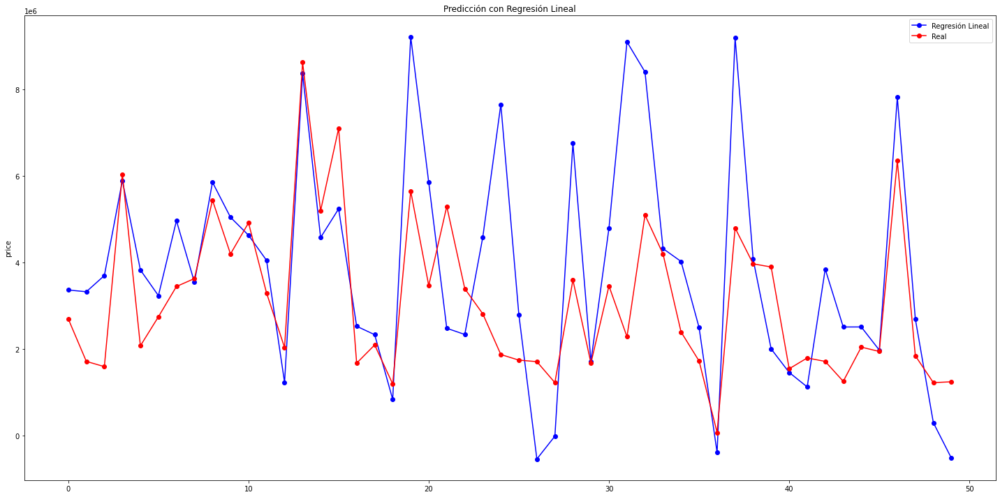

In [ ]:
%matplotlib inline
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_test[:50])))
axs.plot(xvals, y_pred11[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_test[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

Modelamiento con alpha = 10

In [ ]:
LassoModel2 = Lasso(alpha=10)
LassoModel2.fit(X_train, y_train)
print('Coefficients: ', LassoModel2.coef_)
print('Intercept: ',LassoModel2.intercept_)

Coefficients:  [-3.39360773e+05 -6.25169410e+03  8.22278032e+04 -1.07067177e+05
 -6.38097504e+05  1.25460286e+05  1.37539355e+05  4.35818010e+05
  4.67656157e+05 -3.41605987e+05  4.52297580e+05  1.09046184e+03
 -4.10749954e+05 -6.14496299e+05  7.74350426e+06  1.75516514e+06
  1.98514971e+06 -4.83452118e+06 -5.43875077e+06  6.18655981e+05
 -1.44046376e+06 -7.76750374e+05  3.23975569e+06  4.53361044e+05
  4.54980674e+06  3.67063022e+05 -3.41750221e+06 -2.15707604e+05
  5.28176235e+05  0.00000000e+00 -4.40287974e+06  8.01804376e+05
 -8.35546828e+03 -9.78432409e+05 -2.37452481e+06  2.45291941e+06
  2.90816055e+05  9.01759469e+05 -6.73625036e+06  2.98118073e+06
 -3.99196467e+05 -4.34424373e+05 -5.52029260e+05 -5.65753854e+05
 -5.21694768e+05  8.13429024e+05  0.00000000e+00  1.14838668e+06
 -1.46575629e+06  3.43902291e+06 -6.33194394e+05 -2.35054522e+05
 -3.95658946e+06  2.10284464e+06 -4.80324335e+06 -7.94125270e+05
 -5.67683082e+06  1.35456785e+06 -1.94352511e+06 -8.24439777e+06
 -6.439844

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.355e+18, tolerance: 1.656e+15
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [ ]:
coef = dict(zip(X_train.columns, LassoModel2.coef_))
coef

{'Fachada_Monolitica': 452297.5798789537,
 'Fachada_bloque': -410749.9542770043,
 'Fachada_ladrillo': 1090.4618414113443,
 'Fachada_madera': -614496.29922345,
 'Fachada_otros': 467656.1572812556,
 'Fachada_panel': -341605.98700929206,
 'Region_0': 7743504.256960943,
 'Region_1': 1755165.1381951196,
 'Region_10': 4549806.7364181485,
 'Region_11': 367063.0217005639,
 'Region_12': -3417502.2112974743,
 'Region_13': -215707.60350574178,
 'Region_14': 528176.2348029473,
 'Region_15': 0.0,
 'Region_16': -4402879.736602286,
 'Region_17': 801804.3759476276,
 'Region_18': -8355.468280338471,
 'Region_19': -978432.4094854336,
 'Region_2': 1985149.7109033123,
 'Region_20': -2374524.813493068,
 'Region_21': 2452919.412086348,
 'Region_22': 290816.0549800219,
 'Region_23': 901759.4693069212,
 'Region_24': -6736250.364139753,
 'Region_25': 2981180.7343531563,
 'Region_26': -399196.4665141837,
 'Region_27': -434424.3732075105,
 'Region_28': -552029.2599721873,
 'Region_29': -565753.8542760795,
 'Regi

In [ ]:
y_pred2 = LassoModel2.predict(X_train)
y_pred2

array([ 3379162.65329615,   658914.97472524,   645489.30753663, ...,
        4851498.49465009, 12703852.85439285,  2177841.59131765])

In [ ]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento alpha = 10------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred2))
print("R2-score: %.5f" % r2_score(y_train, y_pred2) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred2))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento alpha = 10------------
Residual sum of squares (MSE): 292930996736978.00
R2-score: 0.05641
Adj R2-score: 0.05533


Validación alpha = 10

In [ ]:
X_val, y_val = val.drop(['price'],axis=1), val['price'] 
y_pred21 = LassoModel2.predict(X_val)
y_pred21

NameError: ignored

In [ ]:
n,p = X_val.shape

print('------------ Regresión Lasso con validación (alpha 10)------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred21))
print("R2-score: %.5f" % r2_score(y_val, y_pred21) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred21))*(n-1)/(n-p-1)) )

In [ ]:
%matplotlib inline
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_val[:50])))
axs.plot(xvals, y_pred21[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_val[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

Modelamiento con alpha = 100

In [ ]:
LassoModel3 = Lasso(alpha=100)
LassoModel3.fit(X_train, y_train)
print('Coefficients: ', LassoModel3.coef_)
print('Intercept: ',LassoModel3.intercept_)

In [ ]:
coef = dict(zip(X_train.columns, LassoModel3.coef_))
coef

In [ ]:
y_pred3 = LassoModel3.predict(X_train)
y_pred3

In [ ]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento alpha = 100------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred3))
print("R2-score: %.5f" % r2_score(y_train, y_pred3) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred3))*(n-1)/(n-p-1)) )

Validación alpha = 100

In [ ]:
X_val, y_val = val.drop(['price'],axis=1), val['price'] 
y_pred31 = LassoModel3.predict(X_val)
y_pred31

In [ ]:
n,p = X_val.shape

print('------------ Regresión Lasso con validación (alpha 100)------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred31))
print("R2-score: %.5f" % r2_score(y_val, y_pred31) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred31))*(n-1)/(n-p-1)) )

In [ ]:
%matplotlib inline
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_val[:50])))
axs.plot(xvals, y_pred31[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_val[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

Modelamiento con alpha = 1000

In [ ]:
LassoModel4 = Lasso(alpha=1000)
LassoModel4.fit(X_train, y_train)
print('Coefficients: ', LassoModel4.coef_)
print('Intercept: ',LassoModel4.intercept_)

In [ ]:
coef = dict(zip(X_train.columns, LassoModel4.coef_))
coef

In [ ]:
y_pred4 = LassoModel4.predict(X_train)
y_pred4

In [ ]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento alpha = 1000------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred4))
print("R2-score: %.5f" % r2_score(y_train, y_pred4) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred4))*(n-1)/(n-p-1)) )

Validación alpha = 1000

In [ ]:
X_val, y_val = val.drop(['price'],axis=1), val['price'] 
y_pred41 = LassoModel4.predict(X_val)
y_pred41

In [ ]:
n,p = X_val.shape

print('------------ Regresión Lasso con validación (alpha 1000)------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred41))
print("R2-score: %.5f" % r2_score(y_val, y_pred41) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred41))*(n-1)/(n-p-1)) )

In [ ]:
%matplotlib inline
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_val[:50])))
axs.plot(xvals, y_pred41[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_val[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

## 4.3 Regresión lineal con ajuste L2 - Ridge

Se evaluarán diferentes valores para los siguientes hiperparámetros:
- **Alpha:** Se evaluarán valores de alpha=(0.1, 10, 100 y 1000)

La búsqueda de hiperparámetros se realizará utilizando validación cruzada con 10 particiones

### Modelo con datos sin normalizar

In [ ]:
# Establecemos el espacio de búsqueda para los hiperparámetros que deseamos ajustar. 
param_grid = {'alpha':[0.1, 1,10,100,1000]}
#Creamos una regresión con ajuste de Ridge
RidgeModel = Ridge()

In [ ]:
# Se usará el método GridSearch para evaluar los diferentes hiperparámetros con la partición cruzada con K=10
mejor_modelo = GridSearchCV(RidgeModel, param_grid, cv=10)
# Ajuste del modelo
mejor_modelo.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.1, 1, 10, 100, 1000]})

In [ ]:
#Parámetros del mejor modelo
mejor_modelo.best_params_

{'alpha': 0.1}

In [ ]:
best_Ridge = mejor_modelo.best_estimator_
best_Ridge.fit(X_train, y_train)
print('Coefficients: ', best_Ridge.coef_)
print('Intercept: ',best_Ridge.intercept_)

Coefficients:  [-3.43015984e+05 -5.95544376e+03  8.22289886e+04 -1.07062263e+05
 -6.38112469e+05  1.25458446e+05  1.37539384e+05  4.35902534e+05
  5.42151374e+05 -2.67090496e+05  5.26579378e+05  7.58551609e+04
 -3.36632966e+05 -5.40862449e+05  8.42253823e+06  2.43416184e+06
  2.66399233e+06 -4.19739257e+06 -4.80456457e+06  1.29776707e+06
 -7.78892688e+05 -1.23687250e+05  3.93206409e+06  1.13890652e+06
  5.24636308e+06  1.03681673e+06 -2.77873140e+06  4.45103805e+05
  1.20754129e+06  0.00000000e+00 -3.76643913e+06  1.47726865e+06
  6.67404277e+05 -3.13183034e+05 -1.72730707e+06  3.15001918e+06
  9.58746790e+05  1.57833953e+06 -6.10678211e+06  3.68313326e+06
  2.77767168e+05  1.44695250e+05  1.16106573e+05  1.03030866e+05
  1.28932711e+05  1.49662495e+06  0.00000000e+00  1.82533323e+06
 -8.60201705e+05  4.26090747e+06  2.15861801e+04  4.38812097e+05
 -3.50018303e+06  2.80698208e+06 -4.16561333e+06 -1.55526670e+05
 -5.04446610e+06  2.01740218e+06 -1.27060899e+06 -7.57599617e+06
 -5.808771

In [ ]:
coef = dict(zip(X_train.columns, best_Ridge.coef_))
coef

{'Fachada_Monolitica': 526579.3779863312,
 'Fachada_bloque': -336632.96589492203,
 'Fachada_ladrillo': 75855.16088348623,
 'Fachada_madera': -540862.449375418,
 'Fachada_otros': 542151.3739986462,
 'Fachada_panel': -267090.49649830157,
 'Region_0': 8422538.22995186,
 'Region_1': 2434161.836806827,
 'Region_10': 5246363.079841476,
 'Region_11': 1036816.7311243651,
 'Region_12': -2778731.403574803,
 'Region_13': 445103.80526235537,
 'Region_14': 1207541.2901432477,
 'Region_15': 0.0,
 'Region_16': -3766439.127638458,
 'Region_17': 1477268.6496167919,
 'Region_18': 667404.2774873046,
 'Region_19': -313183.0336957687,
 'Region_2': 2663992.326183756,
 'Region_20': -1727307.0670792866,
 'Region_21': 3150019.1834156695,
 'Region_22': 958746.7903875669,
 'Region_23': 1578339.5265605855,
 'Region_24': -6106782.106842712,
 'Region_25': 3683133.257840483,
 'Region_26': 277767.1679038306,
 'Region_27': 144695.2500880484,
 'Region_28': 116106.57306240914,
 'Region_29': 103030.86555242515,
 'Region_

### Modelo con datos normalizados

In [ ]:
# Establecemos el espacio de búsqueda para los hiperparámetros que deseamos ajustar. 
param_grid = {'alpha':[0.1, 1,10,100,1000]}
#Creamos una regresión con ajuste de Ridge
RidgeModel = Ridge()

In [ ]:
# Se usará el método GridSearch para evaluar los diferentes hiperparámetros con la partición cruzada con K=10
mejor_modelo = GridSearchCV(RidgeModel, param_grid, cv=10)
# Ajuste del modelo
mejor_modelo.fit(X_train_norm, y_train)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.1, 1, 10, 100, 1000]})

In [ ]:
#Parámetros del mejor modelo
mejor_modelo.best_params_

{'alpha': 1000}

In [ ]:
best_Ridge_n = mejor_modelo.best_estimator_
best_Ridge_n.fit(X_train_norm, y_train)
print('Coefficients: ', best_Ridge_n.coef_)
print('Intercept: ',best_Ridge_n.intercept_)

Coefficients:  [  38508.95638169 -201966.26080632  383401.0734321  -666248.39024144
 -510421.74275688 3155876.46910618  889232.71186789  185976.39698058
  148635.8851382  -184370.22017262  166019.99023118  -28774.85667992
  -78014.48526077  -50195.90252015 1402064.98437208   47333.90908362
  -45461.06893572  -84896.41643     -89834.17954001 -149576.94662565
 -107636.26449797  -87020.81123659   15824.60749319 -263506.54376115
  565399.68864043 -118163.26425719 -406626.85372018 -115360.51068949
 -169119.77262722       0.         -229985.13658201 -137009.27405753
 -145462.70365272 -162458.70149067 -202544.34843516  -53214.00495549
  -78705.18122732 -101782.73897481 -264003.20222569 -109298.31360412
 -160313.37777751   -6172.39370255  -92758.09029705 -266579.6994593
  -80796.98622736 -121988.06134667       0.         -136213.2987147
  -20698.15156096   -3528.32226081 -114758.6209032   -67267.07630579
   -9324.5928656  -102925.35630775  -65897.28852072  -33597.62760491
 -197327.05130685   7

In [ ]:
coef = dict(zip(X_train.columns, best_Ridge_n.coef_))
coef

{'Fachada_Monolitica': 166019.99023117864,
 'Fachada_bloque': -78014.4852607652,
 'Fachada_ladrillo': -28774.85667992041,
 'Fachada_madera': -50195.90252015328,
 'Fachada_otros': 148635.88513819664,
 'Fachada_panel': -184370.22017261648,
 'Region_0': 1402064.9843720794,
 'Region_1': 47333.909083616745,
 'Region_10': 565399.6886404286,
 'Region_11': -118163.26425719098,
 'Region_12': -406626.8537201784,
 'Region_13': -115360.51068949405,
 'Region_14': -169119.77262722372,
 'Region_15': 0.0,
 'Region_16': -229985.13658200885,
 'Region_17': -137009.27405752745,
 'Region_18': -145462.70365272413,
 'Region_19': -162458.70149067126,
 'Region_2': -45461.068935715615,
 'Region_20': -202544.34843515547,
 'Region_21': -53214.00495549256,
 'Region_22': -78705.18122731551,
 'Region_23': -101782.73897481455,
 'Region_24': -264003.2022256938,
 'Region_25': -109298.31360412214,
 'Region_26': -160313.3777775069,
 'Region_27': -6172.393702549018,
 'Region_28': -92758.09029704503,
 'Region_29': -266579.

### Evaluación

Vamos a comparar el rendimiento de los modelos entrenados con datos normalizados y con datos sin normalizar

Sin normalizar

---

In [ ]:
y_pred_train = best_Ridge.predict(X_train)
y_pred_test = best_Ridge.predict(X_test)

In [ ]:
n,p = X_train.shape
print('------------ Regresión Ridge sin normalizar (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

------------ Regresión Ridge sin normalizar (train) ------------
Residual sum of squares (MSE): 292930977955655.00
R2-score: 0.05641
Adj R2-score: 0.05533


In [ ]:
n,p = X_test.shape
print('------------ Regresión Ridge sin normalizar (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Ridge sin normalizar (test) ------------
Residual sum of squares (MSE): 248893821732428.00
R2-score: 0.05527
Adj R2-score: 0.05093


Normalizados

---

In [ ]:
y_pred_train_n = best_Ridge_n.predict(X_train_norm)
y_pred_test_n = best_Ridge_n.predict(X_test_norm)

In [ ]:
n,p = X_train.shape
print('------------ Regresión Ridge normalizado (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train_n))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train_n))*(n-1)/(n-p-1)) )

------------ Regresión Ridge normalizado (train) ------------
Residual sum of squares (MSE): 292961974414228.75
R2-score: 0.05631
Adj R2-score: 0.05523


In [ ]:
n,p = X_test.shape
print('------------ Regresión Ridge normalizado (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test_n))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test_n))*(n-1)/(n-p-1)) )

------------ Regresión Ridge normalizado (test) ------------
Residual sum of squares (MSE): 248982342734962.34
R2-score: 0.05494
Adj R2-score: 0.05059


## 4.4 Regresión polinomial

Para realizar las regresiones polinomiales se probará con polinomios de grado 2, 3, 4 y 5

Se usará la tranformación ToPolynomial para añadir columnas que representan las interacciones entre columnas, dependiendo del rango

In [ ]:
class ToPolynomial(BaseEstimator,TransformerMixin):
    def __init__(self,k=2):
        self.k = k

    def fit(self,X,y=None):
        return self
    
    def transform(self,X,y=None):
        columns = X.columns
        X_train_pol = pd.concat([X**(i+1) for i in range(self.k)],axis=1) #Polinomios sin interacciones
        X_train_pol.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(self.k)],-1)
        temp = pd.concat([X[i[0]]*X[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
        temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
        X_train_pol = pd.concat([X_train_pol,temp],axis=1)
        return X_train_pol

### Modelo con datos sin normalizar

Crearemos un pipeline que transofrme los datos en polinomiales y luego les aplique una regresión. Se correrá para varios grados y se evaluará el mejor modelo

In [ ]:
estimators = [
        ('polinomial',ToPolynomial()),
        ('regresion', LinearRegression() )          
    ]

pipe = Pipeline(estimators)

parameters = {
              'polinomial__k':[2,3,4,5],
              }

mejor_modelo = GridSearchCV(pipe, parameters, verbose=2, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)

In [ ]:
# Ajuste del modelo
mejor_modelo.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('polinomial', ToPolynomial()),
                                       ('regresion', LinearRegression())]),
             n_jobs=-1, param_grid={'polinomial__k': [2, 3, 4, 5]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
best_model = mejor_modelo.best_estimator_

pd.DataFrame(mejor_modelo.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_polinomial__k,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,40.656533,4.932048,1.944665,0.593835,2,{'polinomial__k': 2},-7.624055e+28,-8.138937e+28,-8.767039e+22,-1.434673e+24,-1.775072e+25,-3.152984e+28,3.864246e+28,4
1,42.299874,3.120621,1.303204,0.083192,3,{'polinomial__k': 3},-4.783673e+21,-6.875864e+19,-2.904933e+16,-2.990913e+15,-9.202564e+18,-9.723332e+20,1.905842e+21,3
2,42.613165,1.255923,1.387074,0.036353,4,{'polinomial__k': 4},-5.833945e+14,-5.225170e+14,-2.069685e+14,-2.475405e+14,-5.437523e+13,-3.229591e+14,1.994638e+14,1
3,43.146069,2.234106,1.342399,0.206888,5,{'polinomial__k': 5},-4.864588e+14,-4.900369e+14,-2.083829e+14,-2.175717e+14,-2.395047e+14,-3.283910e+14,1.309186e+14,2


In [ ]:
mejor_modelo.best_params_

{'polinomial__k': 4}

In [ ]:
linear = best_model['regresion']
fake_df = best_model['polinomial'].transform(X_test)
print(f'Intercepto: {linear.intercept_}')
coef = list(zip(['Intercepto'] + list(fake_df.columns), [linear.intercept_] + list(linear.coef_)))
coef = pd.DataFrame(coef,columns=['Variable','Parámetro'])
coef

Intercepto: 8248908215.6906595


,Variable,Parámetro
0,Intercepto,8.248908e+09
1,geo_lat 1,-2.106857e+08
2,geo_lon 1,-2.537652e+06
3,level 1,-1.103629e+06
4,levels 1,2.701413e+06
...,...,...
2070,Region_43 Region_45,0.000000e+00
2071,Region_43 Region_46,0.000000e+00
2072,Region_44 Region_45,0.000000e+00
2073,Region_44 Region_46,0.000000e+00


### Evaluación

In [ ]:
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

In [ ]:
n,p = X_train.shape

print('------------ Regresión Polinomial sin normalizar (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

------------ Regresión Polinomial sin normalizar (train) ------------
Residual sum of squares (MSE): 275663875980198.00
R2-score: 0.11203
Adj R2-score: 0.11101


In [ ]:
n,p = X_test.shape

print('------------ Regresión Polinomial sin normalizar (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Polinomial sin normalizar (test) ------------
Residual sum of squares (MSE): 1140454396213630.25
R2-score: -3.32883
Adj R2-score: -3.34872


### Modelo con datos normalizados

In [ ]:
estimators_2 = [
        ('polinomial',ToPolynomial()),
        ('normalizar',StandardScaler()),
        ('regresion', LinearRegression() )          
    ]

pipe_2 = Pipeline(estimators)

parameters = {
              'polinomial__k':[2,3,4,5],
              }

mejor_modelo_norm = GridSearchCV(pipe_2, parameters, verbose=2, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)

In [ ]:
# Ajuste del modelo
mejor_modelo_norm.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('polinomial', ToPolynomial()),
                                       ('regresion', LinearRegression())]),
             n_jobs=-1, param_grid={'polinomial__k': [2, 3, 4, 5]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
best_model_2 = mejor_modelo_norm.best_estimator_

pd.DataFrame(mejor_modelo_norm.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_polinomial__k,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,38.588750,0.955693,1.411862,0.156115,2,{'polinomial__k': 2},-7.624055e+28,-8.138937e+28,-8.767039e+22,-1.434673e+24,-1.775072e+25,-3.152984e+28,3.864246e+28,4
1,43.305297,5.098075,1.303359,0.224428,3,{'polinomial__k': 3},-4.783673e+21,-6.875864e+19,-2.904933e+16,-2.990913e+15,-9.202564e+18,-9.723332e+20,1.905842e+21,3
2,42.998421,1.849962,1.463671,0.222613,4,{'polinomial__k': 4},-5.833945e+14,-5.225170e+14,-2.069685e+14,-2.475405e+14,-5.437523e+13,-3.229591e+14,1.994638e+14,1
3,44.242522,2.889350,1.341816,0.230932,5,{'polinomial__k': 5},-4.864588e+14,-4.900369e+14,-2.083829e+14,-2.175717e+14,-2.395047e+14,-3.283910e+14,1.309186e+14,2


In [ ]:
mejor_modelo_norm.best_params_

{'polinomial__k': 4}

### Evaluación

In [ ]:
y_pred_train_n = best_model_2.predict(X_train)
y_pred_test_n = best_model_2.predict(X_test)

In [ ]:
n,p = X_train.shape

print('------------ Regresión Polinomial normalizada (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train_n))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train_n))*(n-1)/(n-p-1)) )

------------ Regresión Polinomial normalizada (train) ------------
Residual sum of squares (MSE): 275663875980198.00
R2-score: 0.11203
Adj R2-score: 0.11101


In [ ]:
n,p = X_test.shape

print('------------ Regresión Polinomial normalizada (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test_n))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test_n))*(n-1)/(n-p-1)) )

------------ Regresión Polinomial normalizada (test) ------------
Residual sum of squares (MSE): 1140454396213630.25
R2-score: -3.32883
Adj R2-score: -3.34872


### **Preparación de los datos para búsqueda de hiperparámetros**

In [ ]:
#Establecemos el espacio de búsqueda para los hiperparámetros que deseamos ajustar. 
param_grid = {'polinomial__k':[2,3,4,5]}

#Creamos una regresión con distintos grados de polinomio
PoliModel = ToPolynomial()
PoliModel.transform

In [ ]:
# Se usará el método GridSearch para evaluar los diferentes hiperparámetros con la partición cruzada con K=10
mejor_modelo1 = GridSearchCV(PoliModel, param_grid, cv=10)
# Ajuste del modelo
mejor_modelo1.fit(X_train, y_train)

In [ ]:
#Parámetros del mejor modelo
mejor_modelo.best_params_

In [ ]:
best_Polimodel = mejor_modelo.best_estimator_
best_Polimodel.fit(X_train, y_train)
print('Coefficients: ', best_Polimodel.coef_)
print('Intercept: ',best_Polimodel.intercept_)

In [ ]:
coef = dict(zip(X_train.columns, best_Polimodel_n.coef_))
coef

In [ ]:
# Establecemos el espacio de búsqueda para los hiperparámetros que deseamos ajustar. 
param_grid = {'polinomial__k':[2,3,4,5]}
#Creamos una regresión con distintos grados de polinomio
Polimodel = ToPolynomial()
# Se usará el método GridSearch para evaluar los diferentes hiperparámetros con la partición cruzada con K=10
mejor_modelo_norm = GridSearchCV(Polimodel, param_grid, cv=10)
# Con datos normalizados
mejor_modelo_norm.fit(X_train_norm, y_train)

In [ ]:
#Parámetros del mejor modelo
mejor_modelo_norm.best_params_

AttributeError: ignored

In [ ]:
best_Polimodel_n = mejor_modelo_norm.best_estimator_
best_Polimodel_n.fit(X_train_norm, y_train)
print('Coefficients: ', best_Polimodel_n.coef_)
print('Intercept: ',best_Polimodel_n.intercept_)

In [ ]:
coef = dict(zip(X_train.columns, best_Polimodel_n.coef_))
coef

Evaluación

Vamos a comparar el rendimiento de los modelos entrenados con datos normalizados y con datos sin normalizar

Sin normalizar

In [ ]:
y_pred_train = best_Polimodel.predict(X_train)
y_pred_test = best_Polimodel.predict(X_test)

In [ ]:
n,p = X_train.shape
print('------------ Regresión Polinomial sin normalizar (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

In [ ]:
n,p = X_test.shape
print('------------ Regresión Polinomial sin normalizar (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

Normalizada

In [ ]:
y_pred_train_n = best_Polimodel_n.predict(X_train_norm)
y_pred_test_n = best_Polimodel_n.predict(X_test_norm)

In [ ]:
n,p = X_train.shape
print('------------ Regresión Polinomial normalizada (train) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train_n))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train_n))*(n-1)/(n-p-1)) )

In [ ]:
n,p = X_test.shape
print('------------ Regresión Polinomial normalizada (test) ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test_n))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test_n) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test_n))*(n-1)/(n-p-1)) )

### Regresión polinomial en detalle

Se evaluarán grados de polinomio 2, 3, 4, 5

Grado 2

In [ ]:
import itertools

columns = X_train.columns
k2 = 2 #Grado a evaluar
X_train_pol2 = pd.concat([X_train**(i+1) for i in range(k2)],axis=1) #Polinomios sin interacciones
X_train_pol2.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(k2)],-1)
temp = pd.concat([X_train[i[0]]*X_train[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
X_train_pol2 = pd.concat([X_train_pol2,temp],axis=1)


PolyModel2 = LinearRegression().fit(X_train_pol2, y_train)
print ('Coefficients: ', PolyModel2.coef_)
print ('Intercept: ',PolyModel2.intercept_)

Coefficients:  [-1.23411633e+16  6.21568422e+13  2.62539817e+12 ...  0.00000000e+00
  0.00000000e+00  0.00000000e+00]
Intercept:  4082905425502.2817


Modelamiento

In [ ]:
coef_pol = dict(zip(X_train_pol2.columns, PolyModel2.coef_))
coef_pol

{'geo_lat 1': -1.2341163252171736e+16,
 'geo_lon 1': 62156842175868.36,
 'level 1': 2625398169518.297,
 'levels 1': 4313789550.597656,
 'rooms 1': 5401530283999.102,
 'area 1': 21701398676847.65,
 'kitchen_area 1': 3858223997182.336,
 'Used 1': 749264834232.4688,
 'Fachada_otros 1': -213578763399.00586,
 'Fachada_panel 1': -182530893438.73438,
 'Fachada_Monolitica 1': -188691935690.76172,
 'Fachada_ladrillo 1': -2804278042540.797,
 'Fachada_bloque 1': 3945638111274.7344,
 'Fachada_madera 1': -556558440590.5156,
 'Region_0 1': -1894993739465.7969,
 'Region_1 1': -1884466370951.9844,
 'Region_2 1': -1809926040777.9219,
 'Region_3 1': -435656526749.4219,
 'Region_4 1': -1985810473675.7188,
 'Region_5 1': -1884443318170.3438,
 'Region_6 1': -1061563020637.2031,
 'Region_7 1': -1138605127431.1172,
 'Region_8 1': 14850316533381.422,
 'Region_9 1': -1957091200202.9219,
 'Region_10 1': -1884527506024.1406,
 'Region_11 1': -1884479366069.7188,
 'Region_12 1': -1884435912722.375,
 'Region_13 1':

Evaluación grado 2

In [ ]:
y_pred3 = PolyModel2.predict(X_train_pol2)
y_pred3

array([  895670.37315112,  3796245.84584936, -1049825.62899077, ...,
        1129158.20674872,  2382150.74366703,  5390007.27631474])

In [ ]:
n,p = X_train_pol2.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred3))
print("R2-score: %.5f" % r2_score(y_train, y_pred3) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred3))*(n-1)/(n-p-1)) )

------------ Regresión Lineal ------------
Residual sum of squares (MSE): 326261717832610.62
R2-score: 0.08545
Adj R2-score: 0.08406


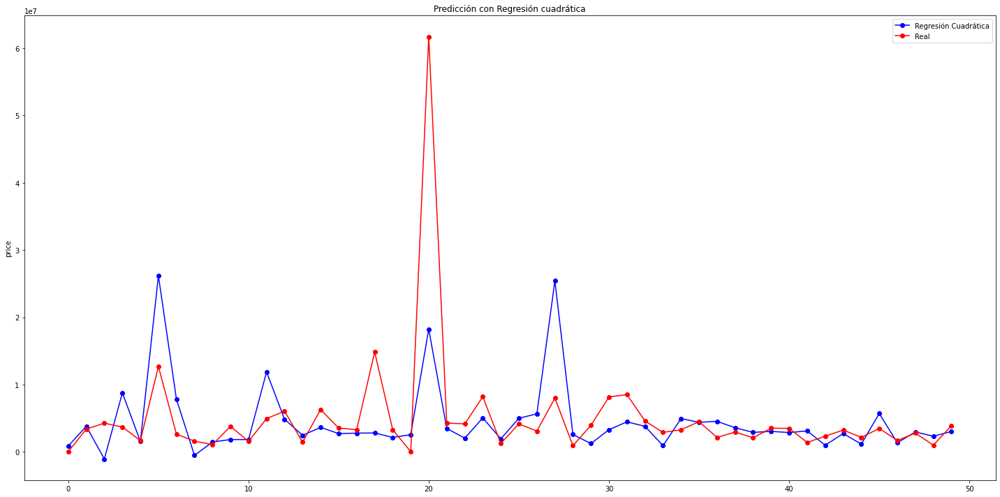

In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred3[:50],'bo-', label='Regresión Cuadrática')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión cuadrática',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

Grado 3

In [ ]:
columns = X_train.columns
k3 = 3 #Grado a evaluar
X_train_pol3 = pd.concat([X_train**(i+1) for i in range(k3)],axis=1) #Polinomios sin interacciones
X_train_pol3.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(k3)],-1)
temp = pd.concat([X_train[i[0]]*X_train[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
X_train_pol3 = pd.concat([X_train_pol3,temp],axis=1)


PolyModel3 = LinearRegression().fit(X_train_pol3, y_train)
print ('Coefficients: ', PolyModel3.coef_)
print ('Intercept: ',PolyModel3.intercept_)

NameError: ignored

In [ ]:
coef_pol3 = dict(zip(X_train_pol3.columns, PolyModel3.coef_))
coef_pol3

NameError: ignored

Evaluación grado 3

In [ ]:
y_pred4 = PolyModel3.predict(X_train_pol3)
y_pred4

NameError: ignored

In [ ]:
n,p = X_train_pol3.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred4))
print("R2-score: %.5f" % r2_score(y_train, y_pred4) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred4))*(n-1)/(n-p-1)) )

In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred4[:50],'bo-', label='Regresión Cúbica')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión cúbica',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

Grado 4

In [ ]:
columns = X_train.columns
k4 = 4 #Grado a evaluar
X_train_pol4 = pd.concat([X_train**(i+1) for i in range(k4)],axis=1) #Polinomios sin interacciones
X_train_pol4.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(k4)],-1)
temp = pd.concat([X_train[i[0]]*X_train[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
X_train_pol4 = pd.concat([X_train_pol4,temp],axis=1)


PolyModel4 = LinearRegression().fit(X_train_pol4, y_train)
print ('Coefficients: ', PolyModel4.coef_)
print ('Intercept: ',PolyModel4.intercept_)

In [ ]:
coef_pol4 = dict(zip(X_train_pol4.columns, PolyModel4.coef_))
coef_pol4

Evaluación grado 4

In [ ]:
y_pred5 = PolyModel4.predict(X_train_pol4)
y_pred5

In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred5[:50],'bo-', label='Regresión grado 4')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión grado 4',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

In [ ]:
n,p = X_train_pol4.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred5))
print("R2-score: %.5f" % r2_score(y_train, y_pred5) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred5))*(n-1)/(n-p-1)) )

Grado 5

In [ ]:
columns = X_train.columns
k5 = 5 #Grado a evaluar
X_train_pol5 = pd.concat([X_train**(i+1) for i in range(k5)],axis=1) #Polinomios sin interacciones
X_train_pol5.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(k5)],-1)
temp = pd.concat([X_train[i[0]]*X_train[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
X_train_pol5 = pd.concat([X_train_pol5,temp],axis=1)


PolyModel5 = LinearRegression().fit(X_train_pol5, y_train)
print ('Coefficients: ', PolyModel5.coef_)
print ('Intercept: ',PolyModel5.intercept_)

In [ ]:
coef_pol5 = dict(zip(X_train_pol5.columns, PolyModel5.coef_))
coef_pol5

Evaluación grado 5

In [ ]:
y_pred6 = PolyModel5.predict(X_train_pol5)
y_pred6

In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred6[:50],'bo-', label='Regresión grado 5')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión grado 5',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

In [ ]:
n,p = X_train_pol5.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred6))
print("R2-score: %.5f" % r2_score(y_train, y_pred6) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred6))*(n-1)/(n-p-1)) )

# 5. Respuestas:
1. Mejores modelos

El R<sup>2</sup> ajustado se tomó teniendo en cuenta el rendimiento del modelo al predecir los datos de test que se habían apartado al inicio.

|| Lasso | Ridge | Polinomial |
|-|-|-|-|
|Normalización|No|No|No|
|R<sup>2</sup> ajustado|0.05093| 0.05093|-3.34872|
|Hiperparámetros|Alpha=10| Alpha=0,1|K=4|

2. Análisis de variables que se condieraron importantes con Lasso

Las variables que tuvieron una correlación positiva más altos en la regresión regularizada con el método Lasso fueron las siguientes:

- Área
- Área de la cocina
- Piso del inmueble
- Si es nuevo o usado
- Fachada monolítica u otras

Además, se vio que algunas de las variables tienen una correlación negativa como:
- Latitud geográfica
- El número de pisos que tiene el edificio
- El número de habitaciones
- Longitud geográfica
- Fachadas de panel, bloque y madera

Por otro lado se observó que la importancia de la región fue variable, debido a que algunas regiones mostraron una correlación positiva, otras una correlación negativa y dos regiones fueron eliminadas por el método Lasso. Esto puede estar asociado a la distribución asimétrica de los inmuebles en las regiones.

3. Rendimiento esperado con el modelo de producción elegido

Tanto el modelo Lasso como el Ridge tuvieron un rendimiento similar tanto con la muestra de entrnemaiento como con la muestra de test para datos no normalizados.

El rednimiento esperado si se implementara este modelo sería una presición del 5%. 
Se recomienda no comprar casas en Rusia basados en este modelo.

